# this is for analysis of titles for harvard library dataset

In [1]:
#load in data from data_cleaned.csv

import pandas as pd
data = pd.read_csv('data_cleaned.csv')

In [2]:
#load wordcloud, nltk, etc
import numpy as np
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt_tab')

stop_words = set(stopwords.words('english'))


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/rekaforgo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/rekaforgo/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [3]:
data.head()

,X,title,subtitle,author,publication_date,language,genre,resource_type,creation_date
0,0,Painting is a supreme fiction,"writings by Jesse Murry, 1980-1993","[['Murry, Jesse'], ['Earnest, Jarrett'], ['Als...",2021,English,"['text', 'still image']",text,2021
1,1,"Beat the story-drum, pum-pum",NaN,"[['Bryan, Ashley'], ['Ahern, M. M.'], ['Athene...",1980,English,"['text', 'still image', 'fairy tales.', 'Fairy...",text,1980
2,2,preparation of the novel,lecture courses and seminars at the Collège de...,"[['Barthes, Roland'], ['Briggs, Kate'], ['Lég...",2011,English,bibliography,text,2010
3,3,Information through the printed word,NaN,"[['Machlup, Fritz'], ['Leeson, Kenneth'], ['Le...",1980,English,bibliography,text,1978
4,4,green book,NaN,"Qaddafi, Muammar",1980,English,government publication,text,1981


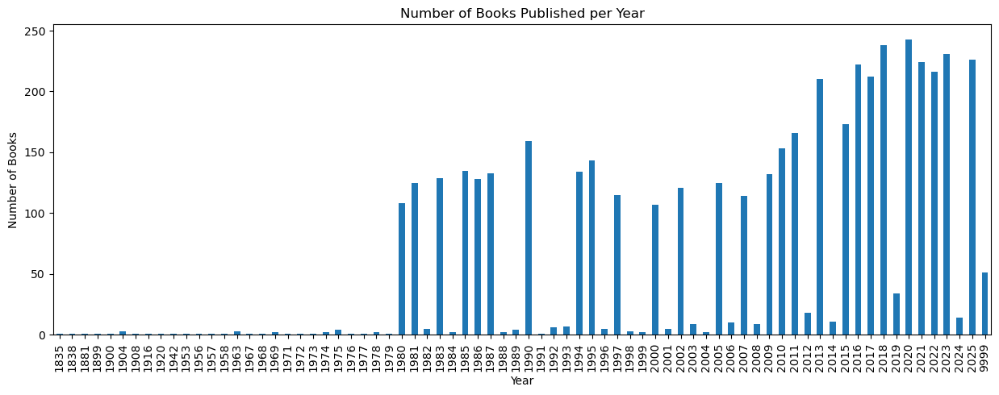

In [ ]:

#filter for english language only
data_en = data[data['language'] == 'English']

#convert publication_date to integer + remove rows with non-integer publication_date
data_en = data_en[pd.to_numeric(data_en['publication_date'], errors='coerce').notnull()]

data_en.head()

#count number of books per year
books_per_year = data_en['publication_date'].value_counts().sort_index()
books_per_year.plot(kind='bar', figsize=(15,5), title='Number of Books Published per Year')
plt.xlabel('Year')
plt.ylabel('Number of Books')
plt.show()

#remove below 80 books per year
years_to_keep = books_per_year[books_per_year >= 80].index.astype(int)
data_en = data_en[data_en['publication_date'].astype(int).isin(years_to_keep)]

In [ ]:
# create a list of titles per year from 1980 - 2024
titles_by_year = {}

for year in range(1980, 2025):
    titles = data_en[data_en['publication_date'].astype(int) == year]['title'].tolist()
    titles_by_year[year] = ' '.join(titles)

#print(titles_by_year[1980])  # Example output for year 1980

Beat the story-drum, pum-pum Information through the printed word green book Essays in medieval culture Bookbinding reader in the text Reasoning about discrimination economic crisis and American society Autobiography Human resources in Japanese industrial development Kierkegaard's relation to Hegel Landlords and tenants in imperial Rome Directory of publishers, printers & book sellers in the Caribbean Community American national standard for book numbering Basic books in the mass media Political theory and political education Demand Functions and the Slutsky Matrix. (PSME-7) letters of Edward FitzGerald Interpretation, an essay in the philosophy of literary criticism life in the fiction of Ford Madox Ford Three British revolutions, 1641, 1688, 1776 War and rural life in the early modern Low Countries Tamil temple myths Cabanis Female labor supply Ugo Foscolo, poet of exile Education and equality in Japan Businessmen and politics in the Rhineland, 1789-1834 Tokutomi Soho, 1863-1957, a j

In [15]:
#generate tokens and remove stopwords
def preprocess_text(text):
    tokens = nltk.word_tokenize(text.lower())
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return ' '.join(filtered_tokens)

filtered_titles_by_year = {year: preprocess_text(titles) for year, titles in titles_by_year.items()}


print(filtered_titles_by_year[1980])  # Example output for year 1980

beat story-drum , pum-pum information printed word green book essays medieval culture bookbinding reader text reasoning discrimination economic crisis american society autobiography human resources japanese industrial development kierkegaard 's relation hegel landlords tenants imperial rome directory publishers , printers & book sellers caribbean community american national standard book numbering basic books mass media political theory political education demand functions slutsky matrix . ( psme-7 ) letters edward fitzgerald interpretation , essay philosophy literary criticism life fiction ford madox ford three british revolutions , 1641 , 1688 , 1776 war rural life early modern low countries tamil temple myths cabanis female labor supply ugo foscolo , poet exile education equality japan businessmen politics rhineland , 1789-1834 tokutomi soho , 1863-1957 , journalist modern japan play comedy culture modern japanese prose poem end russian imperial army modern school movement identity 

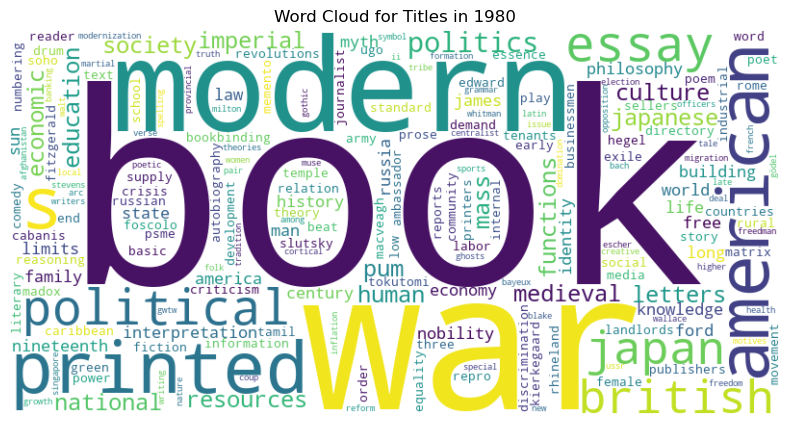

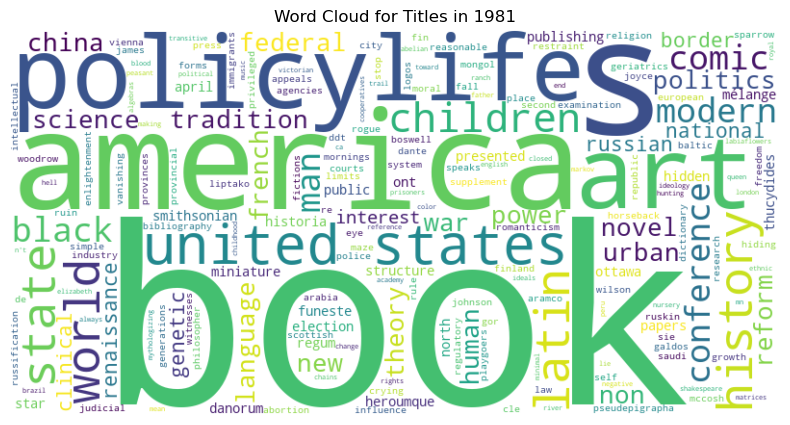

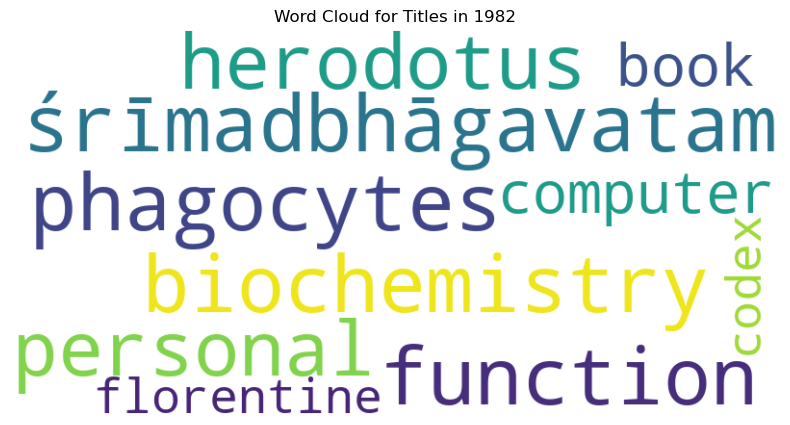

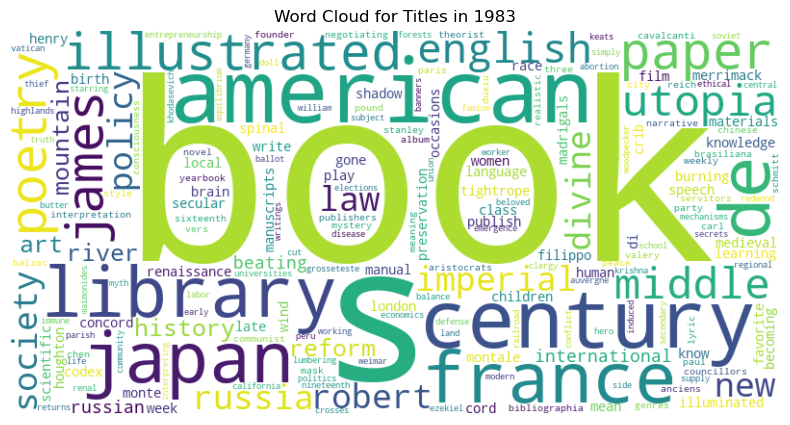

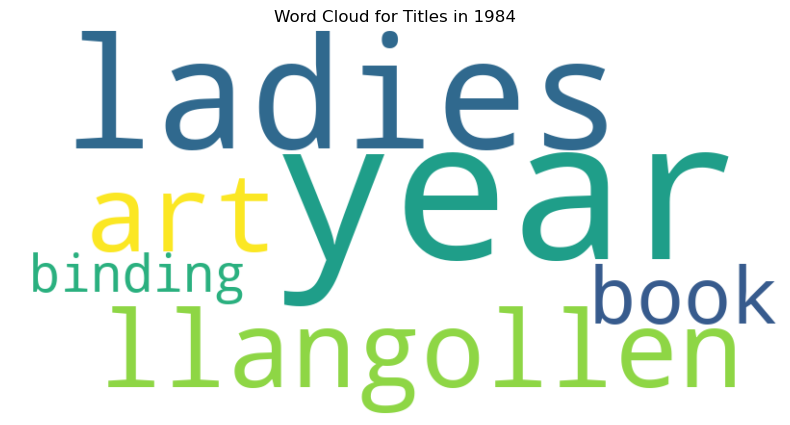

...

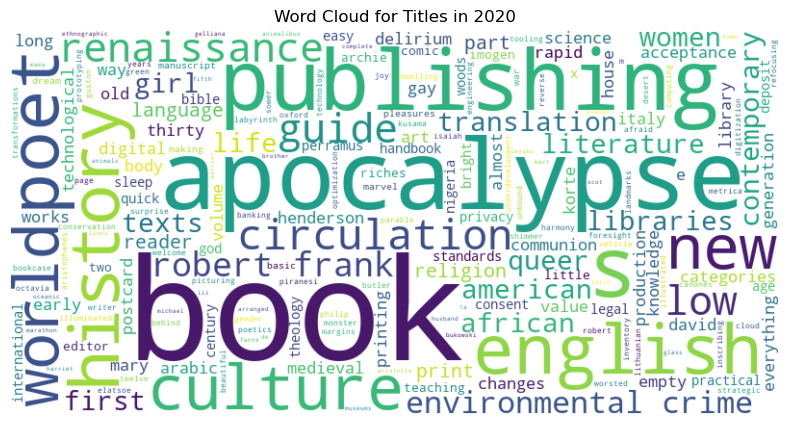

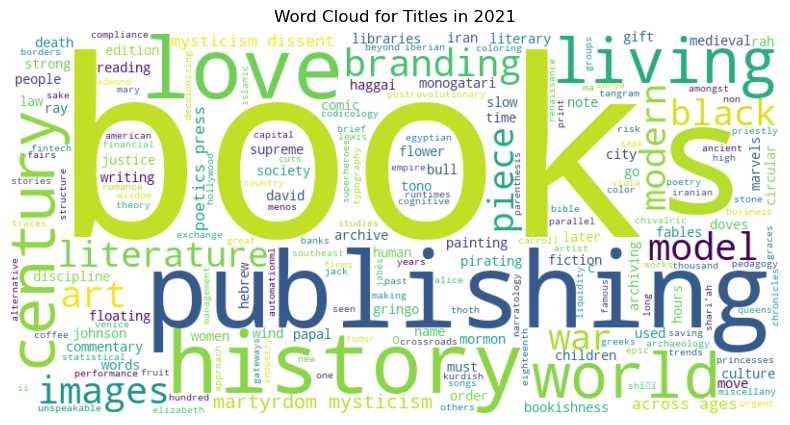

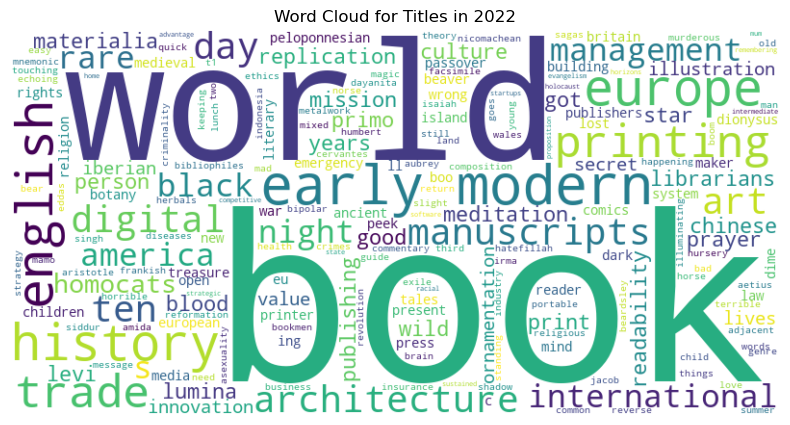

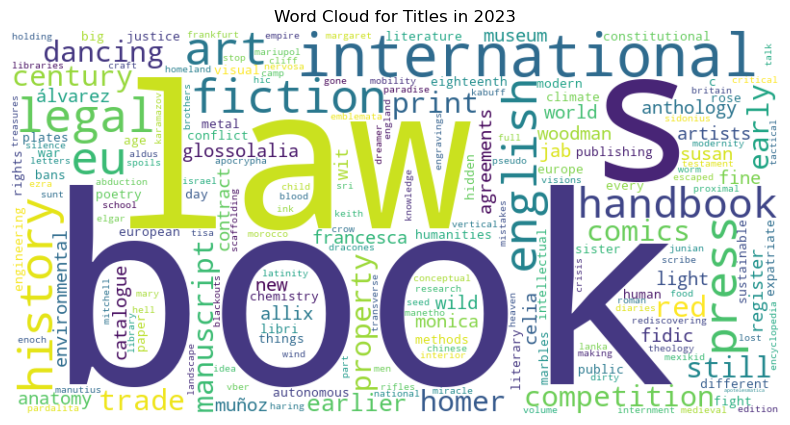

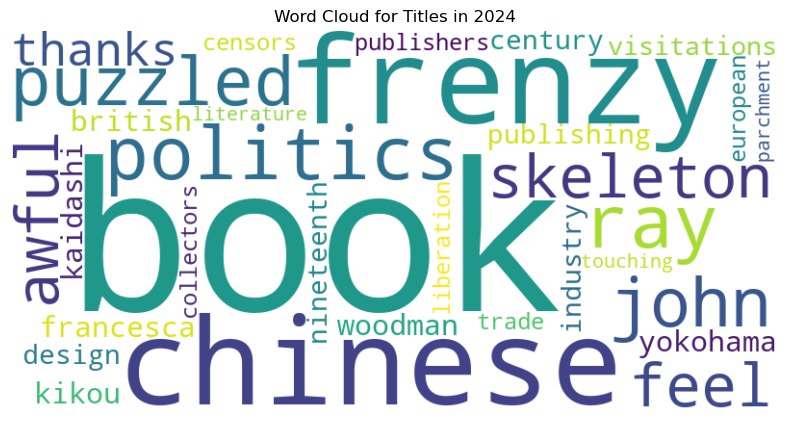

In [16]:
#print wordcloud for each year
for year, text in filtered_titles_by_year.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for Titles in {year}')
    plt.show()